In [1]:
# !unzip "drive/My Drive/Colab Notebooks/dog-vision/dog-breed-identification.zip" -d "drive/My Drive/Colab Notebooks/dog-vision/"

### Get the workspace ready

In [2]:
import tensorflow_hub as hub
import tensorflow as tf
print("TF version:",tf.__version__)
print("TF hub version:",hub.__version__)

# check for gpu availability

print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available :)")


TF version: 2.12.0
TF hub version: 0.13.0
GPU available


## Getting data ready

In [3]:
import pandas as pd

labels_csv = pd.read_csv("drive/MyDrive/Colab Notebooks/dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

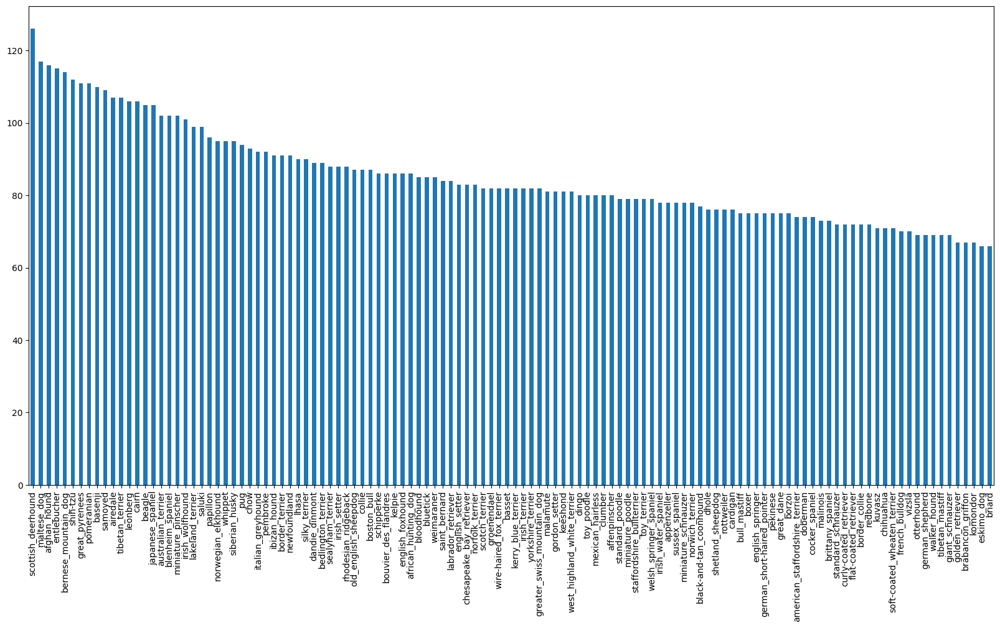

In [5]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

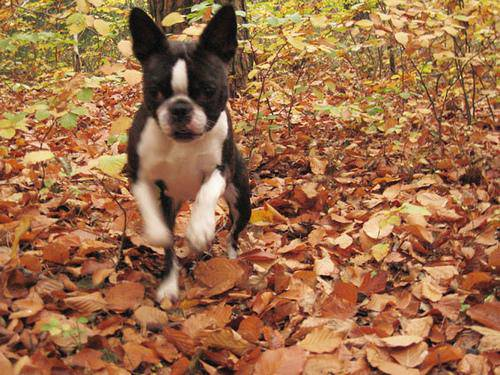

In [6]:
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting images and their labels
Let's get a list of all our images file pathnames

In [7]:
labels_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


In [8]:
filenames = [fname for fname in labels_csv["id"]]
filenames

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64',
 '004396df1acd0f1247b740ca2b14616e',
 '0067dc3eab0b3c3ef0439477624d85d6',
 '00693b8bc2470375cc744a6391d397ec',
 '006cc3ddb9dc1bd827479569fcdc52dc',
 '0075dc49dab4024d12fafe67074d8a81',
 '00792e341f3c6eb33663e415d0715370',
 '007b5a16db9d9ff9d7ad39982703e429',
 '007b8a07882822475a4ce6581e70b1f8',
 '007ff9a78eba2aebb558afea3a51c469',
 '008887054b18ba3c7601792b6a453cc3',
 '008b1271ed1addaccf93783b39deab45',
 '008ba178d6dfc1a583617470d19c1673',
 '009509be3ca7cce0ff9e37c8b09b1125',
 '0097c6242c6f3071762d9f85c3ef1b2f',
 '00a338a92e4e7bf543340dc849230e75',
 '00a366d4b4a9bbb6c8a63126697b7656',
 '00a862390341c5be090dd72bd2bc19ef',
 

In [9]:
filenames = ["drive/MyDrive/Colab Notebooks/dog-vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

In [10]:
filenames[:10]

['drive/MyDrive/Colab Notebooks/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/dog-vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")

else:
  print("Shit Man!!!!")

Filenames match actual amount of files!!! Proceed.


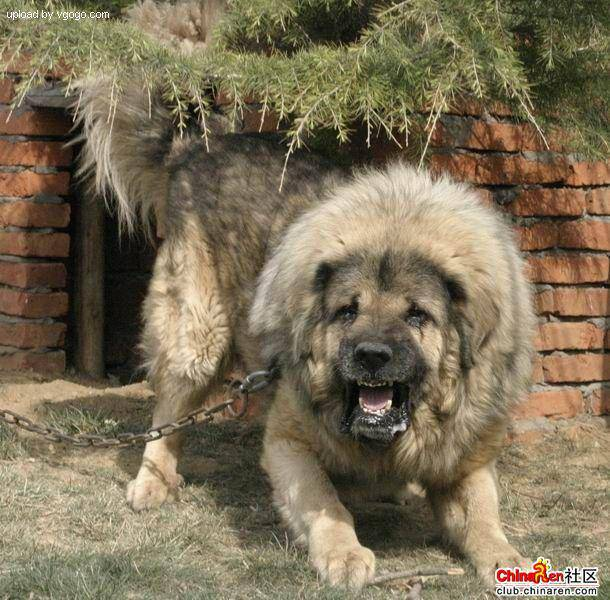

In [12]:
Image(filenames[9000])

since we've now got our training image filepaths in a list,lets prepare our labels.

In [13]:
import numpy as np
labels= labels_csv["breed"].to_numpy()
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)
unique_breeds = np.unique(labels)
len(unique_breeds)
unique_breeds.shape

(120,)

In [15]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [17]:
# example : turning boolean array into integers
print(boolean_labels[2].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creatin gour own validation set
Since the dataset from kaggel does'nt come with a validation set, we're going to create our own.

In [18]:
x= filenames
y = boolean_labels
len(filenames)

10222

we're going to start off experimenting with ~1000 images and increase as needed.

In [19]:
num_images = 1000


In [20]:
from sklearn.model_selection import train_test_split

np.random.seed(42)

x_train,y_train,y_train,y_test = train_test_split(x[:num_images],
                                                  y[:num_images],
                                                  test_size=0.2,
                                                  random_state=42
                                                  )

### Pre-proessing Images(turning images into Tenses)

To preprocess our inages into tensors we're gooing to write a function which does few things:

1. Take image filepath as input.
2. Use Tensorflow to read the file and save it to a variable, 'image'.
3. Turn our 'image' (a jpg) into tensors.
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the 'image' to be a shape of (224,224).
6. Return the modified 'image'.

In [21]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [22]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [23]:
# converting image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [24]:
# define image size
img_size = 224

def process_image(image_path):
  # read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into numerical tensor with 3 color channels(read,green,blue)
  image= tf.image.decode_jpeg(image , channels=3)
  # convert the colour channel values from 0-255 to 0-1 values
  image= tf.image.convert_image_dtype(image, tf.float32)
  #resize the image to 224
  image = tf.image.resize(image, size=[img_size,img_size])
  
  return image

### Turning our data into batch size

why to turn our data into batches?

ans: if we're tring to process 10000+ images in one go...
they all might not fit into memory.

In [25]:
# create a function to return a tuple(image,label)

def get_image_label(image_path,label):
  image = process_image(image_path)
  return image,label

### Let's make a function to turn all data of our data(x & y) into batches

In [26]:
Batch_size = 32

# create a fucntion to turn data inot batch

def create_data_batches(x,y=None, batch_size=Batch_size,valid_data=False , test_data=False):
  if test_data:
    print("Creating test data batch")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  elif valid_data:
    print("Creating validation data batch")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data becomes...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y) ))  
    data= data.shuffle(buffer_size=len(x))
    data = data.map(get_image_label)
    data_batch = data.batch(batch_size)
    return data_batch 

In [27]:
# creating training and validation data
train_data  =  create_data_batches(x_train,y_train)
val_data = create_data_batches(x_train,y_train,valid_data=True)

Creating training data becomes...
Creating validation data batch


In [28]:
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### visualizing data batches

In [29]:
import matplotlib.pyplot as plt

def show_25_image(images,labels):
  plt.figure(figsize=(10,10))

  for i in range(25):
    ax= plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [30]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images) , len(train_labels)

(32, 32)

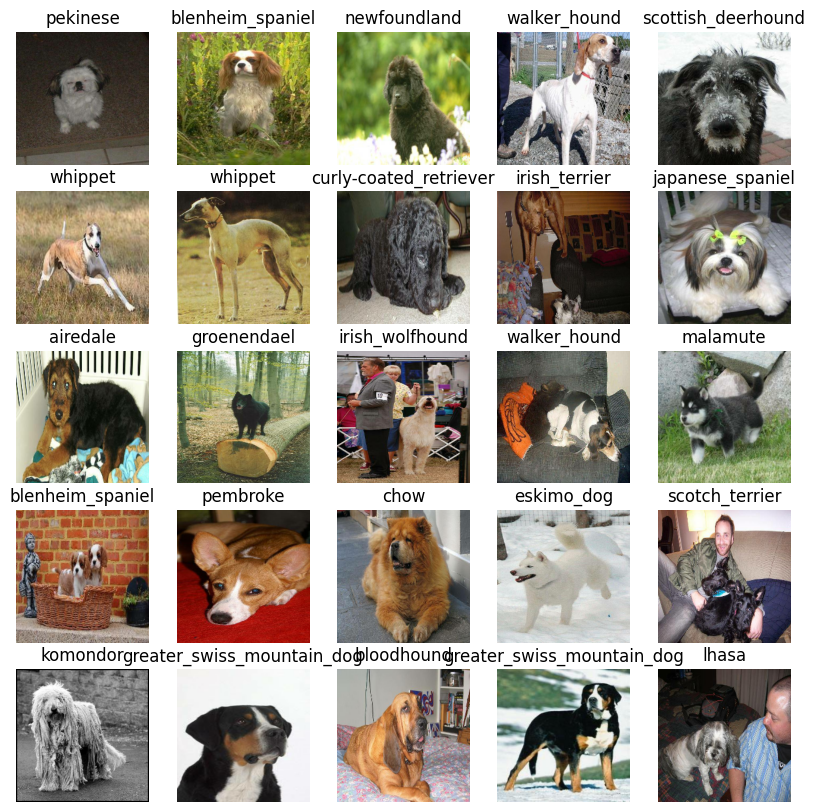

In [31]:
show_25_image(train_images , train_labels)

### Building a model
Before we build a model, there are a few things we need to defne:
* The input shape(our images shape, in the form of tensors) to our model_selection.
* The output shape(image labels,in the form of Tensors) of our model.
* The URL of the model we want to use.

In [32]:
# setup input shape to the model 
INPUT_SHAPE =[None,img_size,img_size,3]

OUTPUT_SHAPE = len(unique_breeds)

#setup model url from tensorflow hub

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_050_224/classification/5"



In [33]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)

  return model

## Creating callback

In [34]:
%load_ext tensorboard

In [35]:
import datetime

def create_tensorboard_callback():
  logdir= os.path.join("/drive/MyDrive/Colab Notebooks/dog-vision/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

In [36]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model

In [37]:
NUM_EPOCHS=100

In [38]:
def train_model():
  model=create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  
  return model


In [39]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_050_224/classification/5
Epoch 1/100
25/25 [==============================] - 141s 5s/step - loss: 5.0130 - accuracy: 0.0525 - val_loss: 2.4160 - val_accuracy: 0.4288
Epoch 2/100
25/25 [==============================] - 8s 326ms/step - loss: 1.7772 - accuracy: 0.5738 - val_loss: 0.8284 - val_accuracy: 0.8813
Epoch 3/100
25/25 [==============================] - 5s 198ms/step - loss: 0.6605 - accuracy: 0.9075 - val_loss: 0.3460 - val_accuracy: 0.9775
Epoch 4/100
25/25 [==============================] - 7s 305ms/step - loss: 0.3023 - accuracy: 0.9850 - val_loss: 0.1867 - val_accuracy: 1.0000
Epoch 5/100
25/25 [==============================] - 4s 181ms/step - loss: 0.1737 - accuracy: 0.9987 - val_loss: 0.1211 - val_accuracy: 1.0000
Epoch 6/100
25/25 [==============================] - 5s 197ms/step - loss: 0.1154 - accuracy: 1.0000 - val_loss: 0.0886 - val_accuracy: 1.0000
Epoch 7/100
25/25 [==============================]

In [40]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/dog-vision/logs

Output hidden; open in https://colab.research.google.com to view.

### Making and evaluating predictions using a trained model

In [41]:
predictions = model.predict(val_data, verbose=1)
predictions

25/25 [==============================] - 4s 94ms/step


array([[7.5217086e-04, 6.7269146e-05, 1.5465293e-05, ..., 2.5579257e-07,
        1.1084932e-05, 7.1253606e-05],
       [9.7693445e-04, 3.5133920e-04, 6.8200131e-07, ..., 4.8051879e-07,
        8.1728562e-05, 2.3791650e-05],
       [1.3925285e-05, 3.3057370e-04, 3.7213944e-08, ..., 1.5616529e-06,
        3.5401595e-08, 3.4415591e-04],
       ...,
       [6.9766596e-05, 4.4485880e-03, 1.2555562e-05, ..., 6.0891627e-05,
        9.4968289e-07, 4.7756315e-04],
       [4.5028723e-06, 7.0725400e-05, 2.8052729e-05, ..., 2.6205615e-05,
        3.6370573e-05, 2.5667938e-05],
       [2.0939938e-06, 6.8542568e-06, 1.9135160e-04, ..., 2.4091816e-04,
        7.5458083e-03, 3.4491626e-05]], dtype=float32)

In [42]:
#first predictions
index=42

print(predictions[index])
print(f"max value (probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.9326395e-05 9.3810173e-05 2.4378240e-04 2.3890974e-04 1.9937668e-03
 1.9784478e-07 1.1822125e-05 1.7968830e-05 1.4541706e-04 1.0441758e-05
 3.5090055e-04 3.4474881e-05 9.6395422e-07 8.4265944e-04 1.7514803e-04
 8.5277177e-05 1.3757865e-07 1.8709671e-03 2.7347403e-05 3.9272021e-05
 4.2115953e-06 1.3626999e-05 3.2561638e-06 1.4103501e-04 6.0948275e-07
 3.6696549e-06 4.4504642e-03 1.8911927e-05 3.7818572e-05 2.0317575e-03
 2.3080723e-03 7.9625106e-06 3.9826246e-04 3.5905116e-06 9.7182878e-05
 6.9247522e-05 3.0873288e-04 3.7369347e-05 2.3620742e-06 1.7407596e-04
 4.8834283e-07 1.2389947e-04 1.6951936e-06 8.3103083e-04 1.0971693e-06
 8.5710235e-06 7.4309987e-06 6.5615593e-04 3.8381426e-05 1.4022865e-03
 3.8498918e-05 9.6319141e-05 4.4283471e-03 3.7547707e-07 2.9597129e-05
 1.2920068e-05 3.0091111e-04 1.3724575e-04 1.5250531e-05 8.2462508e-04
 3.4795958e-04 7.6972623e-04 5.6272896e-04 1.3654032e-05 3.6141183e-04
 1.6237496e-05 9.2004884e-06 6.3914496e-07 9.2600000e-01 3.4641661e-04
 9.591

In [43]:
unique_breeds[20]

'bouvier_des_flandres'

Note: Prediction probabilities are also known as confidence levels.

In [44]:
def get_preds_label(predictions_probabilities):

  return unique_breeds[np.argmax(predictions_probabilities)]

pred_label = get_preds_label(predictions[81
                                         ])
pred_label

'doberman'

In [45]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in batch dataset, we'll have to unbatchify it to make predictions on the validation images and the compare those predictions to the validations labels(turn labels.)

In [46]:
# create a function to unbatch a batch dataset

def unbatchify(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)

  return images,labels

val_images, val_labels = unbatchify(val_data)

  
    

In [47]:
images_ = []
labels =[]

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels.append(label)

In [48]:
get_preds_label(labels[0])


'cairn'

In [49]:
get_preds_label(predictions[0])

'cairn'